# Training NVIDIA NeMo's FastConformer-CTC on Telugu Datasets

In [44]:
!ls

'=3.3.2'    configs     notebooks   startup_script.sh   temp
 asr_venv   documents   resources   te_manifest.json


In [ ]:
BRANCH = 'r1.21.0'
!python3 -m pip install git+https://github.com/NVIDIA/NeMo.git@$BRANCH#egg=nemo_toolkit[all]

#### Exploring the data

In [ ]:
data_path = "resources/newsonair_v5/telugu/"

# listing the subdirectories in the data path

import os
for root, dirs, files in os.walk(data_path):
    for name in dirs:
        print(os.path.join(root, name))


In [ ]:
## selecting only the first subfolder of the ai4bharat telugu dataset

sample_data = "resources/newsonair_v5/telugu/Regional-Hyderabad-Telugu-1310-201919133558"

# listing the files in the sample data

for root, dirs, files in os.walk(sample_data):
    for name in files:
        print(os.path.join(root, name))

In [17]:
import librosa
import IPython.display as ipd

In [13]:
example_file = "resources/newsonair_v5/telugu/Regional-Hyderabad-Telugu-1310-201919133558/sent_4.wav"
audio, sample_rate = librosa.load(example_file)

ipd.Audio(audio, rate=sample_rate)

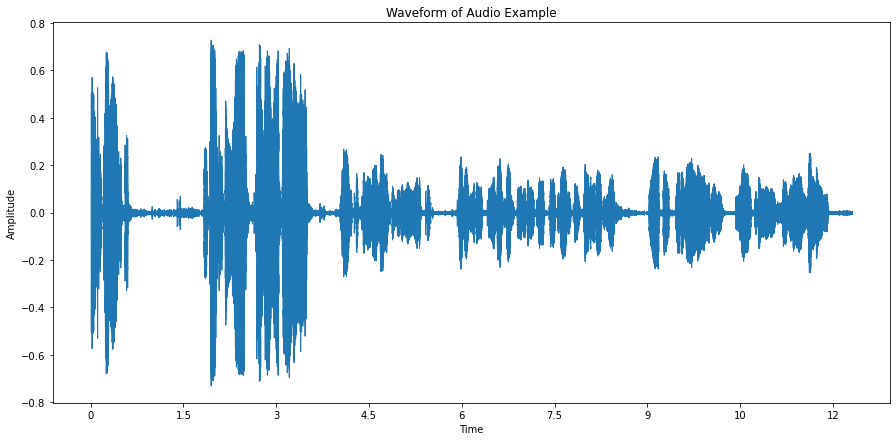

In [14]:
%matplotlib inline
import librosa.display
import matplotlib.pyplot as plt

# Plot our example audio file's waveform
plt.rcParams['figure.figsize'] = (15,7)
plt.title('Waveform of Audio Example')
plt.ylabel('Amplitude')

_ = librosa.display.waveshow(audio)

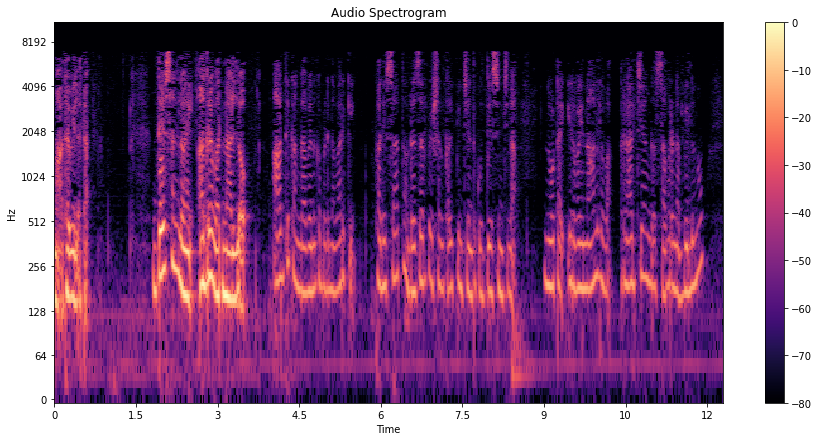

In [15]:
import numpy as np

# Get spectrogram using Librosa's Short-Time Fourier Transform (stft)
spec = np.abs(librosa.stft(audio))
spec_db = librosa.amplitude_to_db(spec, ref=np.max)  # Decibels

# Use log scale to view frequencies
librosa.display.specshow(spec_db, y_axis='log', x_axis='time')
plt.colorbar()
plt.title('Audio Spectrogram');

In [4]:
## getting the transcripts

transcripts_path = "resources/shrutilipi_fairseq/telugu"


for root, dirs, files in os.walk(transcripts_path):
    for name in files:
        print(os.path.join(root, name))

resources/shrutilipi_fairseq/telugu/train.ltr
resources/shrutilipi_fairseq/telugu/train.tsv
resources/shrutilipi_fairseq/telugu/train.wrd


In [3]:
# reading the ltr, tsv and wrd files

ltr_file = "resources/shrutilipi_fairseq/telugu/train.ltr"
tsv_file = "resources/shrutilipi_fairseq/telugu/train.tsv"
wrd_file = "resources/shrutilipi_fairseq/telugu/train.wrd"

import pandas as pd

ltr_df = pd.read_csv(ltr_file, header=None)
tsv_df = pd.read_csv(tsv_file, header=None)


In [6]:
# read the wrd file and convert it into a list

wrd_list = []
with open(wrd_file, 'r') as f:
    for line in f:
        wrd_list.append(line.strip())
len(wrd_list)

216869

In [7]:
tsv_df.head()

,0
0,/nlsasfs/home/ai4bharat/gramesh/speechteam/git...
1,Regional-Vijayawada-Telugu-0645-202082682443/s...
2,Regional-Vijayawada-Telugu-0645-202082682443/s...
3,Regional-Vijayawada-Telugu-0645-202082682443/s...
4,Regional-Vijayawada-Telugu-1320-20201128145719...


In [4]:
path_list = tsv_df[0].tolist()

In [11]:
path_list[:5]

['/nlsasfs/home/ai4bharat/gramesh/speechteam/github_repos/indicAlignment/data/newsonair_v5/telugu',
 'Regional-Vijayawada-Telugu-0645-202082682443/sent_58.wav\t6400',
 'Regional-Vijayawada-Telugu-0645-202082682443/sent_104.wav\t21440',
 'Regional-Vijayawada-Telugu-0645-202082682443/sent_9.wav\t145280',
 'Regional-Vijayawada-Telugu-1320-20201128145719/sent_46.wav\t24960']

In [5]:
#parse the path_list and convert it to a 2d dataframe of file names and sample rates by splitting each string by \t in each list element

path_list = [i.split('\t') for i in path_list if '\t' in i]
len(path_list)

216869

In [6]:
path_df = pd.DataFrame(path_list, columns=['file_name', 'sample_rate'])

path_df.head()

,file_name,sample_rate
0,Regional-Vijayawada-Telugu-0645-202082682443/s...,6400
1,Regional-Vijayawada-Telugu-0645-202082682443/s...,21440
2,Regional-Vijayawada-Telugu-0645-202082682443/s...,145280
3,Regional-Vijayawada-Telugu-1320-20201128145719...,24960
4,Regional-Vijayawada-Telugu-1320-20201128145719...,6720


In [15]:
# add resources/newsonair_v5/telugu/ to each file name in the path_df

path_df['file_name'] = 'resources/newsonair_v5/telugu/' + path_df['file_name']

path_df.head()

,file_name,sample_rate
0,resources/newsonair_v5/telugu/Regional-Vijayaw...,6400
1,resources/newsonair_v5/telugu/Regional-Vijayaw...,21440
2,resources/newsonair_v5/telugu/Regional-Vijayaw...,145280
3,resources/newsonair_v5/telugu/Regional-Vijayaw...,24960
4,resources/newsonair_v5/telugu/Regional-Vijayaw...,6720


In [50]:
ipd.Audio(path_df['file_name'][0], rate=int(path_df['sample_rate'][0]))

In [69]:
for i in range(5):
    ipd.display(ipd.Audio(path_df['file_name'][i], rate=int(path_df['sample_rate'][i])))
    print("corresponding transcript: ", wrd_list[i])

corresponding transcript:  కాగా


corresponding transcript:  ఆంధ్రప్రదేశ్ లో ప్రైవేటు


corresponding transcript:  ప్రధాన మంత్రి నరేంద్ర మోదీ తన మనసులోని భావాలను ఆకాశవాణి ద్వారా దేశ ప్రజలతో పంచుకొనే మన్ కీ బాత్ కార్యక్రమం రేపు ఉదయం పదకొండు గంటలకు ప్రసారమవుతుంది


corresponding transcript:  గండి పడిన చెరువులను పరిశీలించి


corresponding transcript:  కాగా


In [18]:
for i in range(216813, 216817):
    ipd.display(ipd.Audio(path_df['file_name'][i], rate=int(path_df['sample_rate'][i])))
    print("corresponding transcript: ", wrd_list[i])


corresponding transcript:  నాలుగు ఆంధ్రప్రదేశ్ కు జీవనాడి అయిన పోలవరం ప్రాజెక్టు నిర్మాణంపట్ల కేంద్ర ప్రభుత్వం చిత్తశుద్ధితో ఉందని పార్లమెంటు సభ్యులు కంభంపాటి హరిబాబు చెప్పారు


corresponding transcript:  నైపుణ్యం గల మానవ వనరులు ఆంధ్రప్రదేశ్ లో ఉన్నాయని


corresponding transcript:  రాష్ట్రానికి కాంగ్రెస్ పార్టీ మాత్రమే ప్రత్యేకహోదా ఇవ్వగలదని పోలవరం ప్రాజెక్టు నిర్మాణాన్ని పూర్తి చేయగలదని పేర్కొన్నారు


corresponding transcript:  ఫైబర్ గ్రిడ్ ద్వారా ప్రతి ఇంటికి ఇంటర్నెట్ సౌకర్యం రెండు కల్పించామని సెన్సార్ల ఆధారిత వీధి దీపాల వ్యవస్థను రాష్ట్ర వ్యాప్తంగా ప్రవేశపెట్టామని చెప్పారు


In [19]:
len(path_df), len(wrd_list)

(216869, 216869)

In [20]:
path_df['transcriptions'] = wrd_list
path_df.head()

,file_name,sample_rate,transcriptions
0,resources/newsonair_v5/telugu/Regional-Vijayaw...,6400,కాగా
1,resources/newsonair_v5/telugu/Regional-Vijayaw...,21440,ఆంధ్రప్రదేశ్ లో ప్రైవేటు
2,resources/newsonair_v5/telugu/Regional-Vijayaw...,145280,ప్రధాన మంత్రి నరేంద్ర మోదీ తన మనసులోని భావాలను...
3,resources/newsonair_v5/telugu/Regional-Vijayaw...,24960,గండి పడిన చెరువులను పరిశీలించి
4,resources/newsonair_v5/telugu/Regional-Vijayaw...,6720,కాగా


In [21]:
# create a new column for the length of the audio files

path_df['duration'] = path_df['file_name'].apply(lambda x: librosa.get_duration(filename=x))

/tmp/ipykernel_24060/3543086528.py:3: FutureWarning: get_duration() keyword argument 'filename' has been renamed to 'path' in version 0.10.0.
	This alias will be removed in version 1.0.
  path_df['duration'] = path_df['file_name'].apply(lambda x: librosa.get_duration(filename=x))


In [23]:
# export the dataframe to a csv file

path_df.to_csv('resources/newsonair_v5/telugu/train.csv', index=False)

In [2]:
import pandas as pd

In [3]:
import json

In [4]:
path_df = pd.read_csv('resources/newsonair_v5/telugu/train.csv')

In [5]:
# print the first row of the dataframe

path_df.iloc[0]

file_name         resources/newsonair_v5/telugu/Regional-Vijayaw...
sample_rate                                                    6400
transcriptions                                                 కాగా
duration                                                        0.4
Name: 0, dtype: object

In [6]:
import json

with open('te_manifest.json', 'w') as fout:
    for i in range(len(path_df)):
        metadata = {
            "audio_filepath": path_df['file_name'][i],
            "duration": path_df['duration'][i],
            "text": path_df['transcriptions'][i]
        }
        json.dump(metadata, fout)
        fout.write('\n')

In [7]:
sample = ""

with open('te_manifest.json') as f:
    for line in f:
        print(line)
        sample = line
        break

{"audio_filepath": "resources/newsonair_v5/telugu/Regional-Vijayawada-Telugu-0645-202082682443/sent_58.wav", "duration": 0.4, "text": "\u0c15\u0c3e\u0c17\u0c3e"}



In [34]:
sample_dict = json.loads(sample)
sample_dict["text"]

'కాగా'

In [43]:
try:
    from ruamel.yaml import YAML
except ModuleNotFoundError:
    from ruamel_yaml import YAML
config_path = './configs/fast-conformer_ctc_bpe.yaml'

if not os.path.exists(config_path):
    # Grab the config we'll use in this example
    BRANCH = 'r1.21.0'
    !mkdir configs
    !wget -P configs/ https://raw.githubusercontent.com/NVIDIA/NeMo/$BRANCH/examples/asr/conf/fastconformer/fast-conformer_ctc_bpe.yaml

yaml = YAML(typ='safe')
with open(config_path) as f:
    params = yaml.load(f)
print(params)

{'name': 'FastConformer-CTC-BPE', 'model': {'sample_rate': 16000, 'log_prediction': True, 'ctc_reduction': 'mean_volume', 'skip_nan_grad': False, 'train_ds': {'manifest_filepath': '???', 'sample_rate': '${model.sample_rate}', 'batch_size': 16, 'shuffle': True, 'num_workers': 8, 'pin_memory': True, 'max_duration': 16.7, 'min_duration': 0.1, 'is_tarred': False, 'tarred_audio_filepaths': None, 'shuffle_n': 2048, 'bucketing_strategy': 'fully_randomized', 'bucketing_batch_size': None}, 'validation_ds': {'manifest_filepath': '???', 'sample_rate': '${model.sample_rate}', 'batch_size': 16, 'shuffle': False, 'use_start_end_token': False, 'num_workers': 8, 'pin_memory': True}, 'test_ds': {'manifest_filepath': None, 'sample_rate': '${model.sample_rate}', 'batch_size': 16, 'shuffle': False, 'use_start_end_token': False, 'num_workers': 8, 'pin_memory': True}, 'tokenizer': {'dir': '???', 'type': 'bpe'}, 'preprocessor': {'_target_': 'nemo.collections.asr.modules.AudioToMelSpectrogramPreprocessor', 's

In [40]:
!ls

'=3.3.2'    configs     notebooks   startup_script.sh   temp
 asr_venv   documents   resources   te_manifest.json


In [41]:
!rm -rf configs

##### Loading another dataset

In [59]:
!ls

'=3.3.2'    configs     notebooks   startup_script.sh   temp
 asr_venv   documents   resources   te_manifest.json


In [3]:
path = "resources/tel_openslr/"

# finding the files in the path

openslr_files = []

for root, dirs, files in os.walk(path):
    for name in files:
        openslr_files.append(os.path.join(root, name))

In [4]:
openslr_manifest_paths = [i for i in openslr_files if '.wav' not in i]
openslr_manifest_paths

['resources/tel_openslr/line_index_female.tsv',
 'resources/tel_openslr/line_index.tsv',
 'resources/tel_openslr/LICENSE']

In [7]:
# read the manifest files

openslr_manifest_df = pd.read_csv(openslr_manifest_paths[0], sep='\t', header=None)

openslr_manifest_df.head()

,0,1
0,tef_01033_00351357063,ఈ వివాదం సెప్టెంబర్ రెండు వేల తొమ్మిదిన పరిష్క...
1,tef_02828_01625402654,ఒక బ్యాంకు ఒక ప్రాథమిక పాఠశాల ఉన్నాయి
2,tef_08318_01333265498,చాలా గొంగళి పురుగులు షాకాహారులే
3,tef_04830_00246502215,ప్రిన్సిపాల్ ఒక మొమెంటోతో ప్రవేశించారు
4,tef_09281_02034334714,ట్రూమాన్ లైబ్రరీ అండ్ మ్యూజియం


In [8]:
openslr_manifest_df2 = pd.read_csv(openslr_manifest_paths[1], sep='\t', header=None)

openslr_manifest_df2.head()

,0,1
0,tem_07220_01981175708,దీనిని తటస్థీకరణము అందురు
1,tem_06359_01516502961,దీనిని స్కోరుగా అనువదిస్తారు
2,tem_02812_01868000938,రెండంతస్తుల భవనాలు పూర్తిగా నీట మునిగాయి
3,tem_08680_00300488472,పిన్ కోడ్ అయిదు లక్షలు అయిదు వేలు అయిదు వందలు ...
4,tem_02769_01899577322,ద్రవరూపంలోని మలినాలు తేమ వంటివి


In [9]:
# combine the two dataframes

openslr_manifest_df = pd.concat([openslr_manifest_df, openslr_manifest_df2], ignore_index=True)
openslr_manifest_df.head()

,0,1
0,tef_01033_00351357063,ఈ వివాదం సెప్టెంబర్ రెండు వేల తొమ్మిదిన పరిష్క...
1,tef_02828_01625402654,ఒక బ్యాంకు ఒక ప్రాథమిక పాఠశాల ఉన్నాయి
2,tef_08318_01333265498,చాలా గొంగళి పురుగులు షాకాహారులే
3,tef_04830_00246502215,ప్రిన్సిపాల్ ఒక మొమెంటోతో ప్రవేశించారు
4,tef_09281_02034334714,ట్రూమాన్ లైబ్రరీ అండ్ మ్యూజియం


In [10]:
# rename the columns

openslr_manifest_df.columns = ['file_name', 'transcriptions']

In [11]:
# add resources/tel_openslr/ to each file name in the path_df and .wav to each file name

openslr_manifest_df['file_name'] = 'resources/tel_openslr/' + openslr_manifest_df['file_name'] + '.wav'

In [12]:
openslr_manifest_df.head()

,file_name,transcriptions
0,resources/tel_openslr/tef_01033_00351357063.wav,ఈ వివాదం సెప్టెంబర్ రెండు వేల తొమ్మిదిన పరిష్క...
1,resources/tel_openslr/tef_02828_01625402654.wav,ఒక బ్యాంకు ఒక ప్రాథమిక పాఠశాల ఉన్నాయి
2,resources/tel_openslr/tef_08318_01333265498.wav,చాలా గొంగళి పురుగులు షాకాహారులే
3,resources/tel_openslr/tef_04830_00246502215.wav,ప్రిన్సిపాల్ ఒక మొమెంటోతో ప్రవేశించారు
4,resources/tel_openslr/tef_09281_02034334714.wav,ట్రూమాన్ లైబ్రరీ అండ్ మ్యూజియం


In [ ]:
for i in range(len(openslr_manifest_df)-5, len(openslr_manifest_df)):
    ipd.display(ipd.Audio(openslr_manifest_df['file_name'][i]))
    print("corresponding transcript: ", openslr_manifest_df['transcriptions'][i])

In [14]:
import librosa

In [15]:
# create a new column for the length of the audio files

openslr_manifest_df['duration'] = openslr_manifest_df['file_name'].apply(lambda x: librosa.get_duration(filename=x))

/tmp/ipykernel_4496/754125687.py:3: FutureWarning: get_duration() keyword argument 'filename' has been renamed to 'path' in version 0.10.0.
	This alias will be removed in version 1.0.
  openslr_manifest_df['duration'] = openslr_manifest_df['file_name'].apply(lambda x: librosa.get_duration(filename=x))


In [16]:
openslr_manifest_df.head()

,file_name,transcriptions,duration
0,resources/tel_openslr/tef_01033_00351357063.wav,ఈ వివాదం సెప్టెంబర్ రెండు వేల తొమ్మిదిన పరిష్క...,4.693333
1,resources/tel_openslr/tef_02828_01625402654.wav,ఒక బ్యాంకు ఒక ప్రాథమిక పాఠశాల ఉన్నాయి,4.181333
2,resources/tel_openslr/tef_08318_01333265498.wav,చాలా గొంగళి పురుగులు షాకాహారులే,3.072000
3,resources/tel_openslr/tef_04830_00246502215.wav,ప్రిన్సిపాల్ ఒక మొమెంటోతో ప్రవేశించారు,3.328000
4,resources/tel_openslr/tef_09281_02034334714.wav,ట్రూమాన్ లైబ్రరీ అండ్ మ్యూజియం,3.669333


In [17]:
# export the dataframe to a csv file

openslr_manifest_df.to_csv('resources/tel_openslr/openslr_manifest.csv', index=False)

In [ ]:
openslr_manifest_df = pd.read_csv('resources/tel_openslr/openslr_manifest.csv')

In [74]:
# add these columns to the manifest.json file

with open('te_manifest.json', 'a') as fout:
    for i in range(len(openslr_manifest_df)):
        metadata = {
            "audio_filepath": openslr_manifest_df['file_name'][i],
            "duration": openslr_manifest_df['duration'][i],
            "text": openslr_manifest_df['transcriptions'][i]
        }
        json.dump(metadata, fout)
        fout.write('\n')

In [75]:
# read te_manifest.json file and find the length of the file

with open('te_manifest.json') as f:
    for i, l in enumerate(f):
        pass
print(i + 1)


221317


In [77]:
len(openslr_manifest_df) + len(path_df)

221317

In [78]:
# split the te_manifest.json file into train and validation files after shuffling

import random

with open('te_manifest.json') as f:
    lines = f.readlines()
    random.shuffle(lines)
    with open('te_manifest_train.json', 'w') as f1:
        f1.writelines(lines[:int(len(lines)*0.8)])
    with open('te_manifest_val.json', 'w') as f2:
        f2.writelines(lines[int(len(lines)*0.8):])

In [79]:
with open('te_manifest_train.json') as f:
    for i, l in enumerate(f):
        pass
print(i + 1)

with open('te_manifest_val.json') as f:
    for i, l in enumerate(f):
        pass
print(i + 1)

177053
44264


In [83]:
train_dataset = 'te_manifest_train.json'
test_dataset = 'te_manifest_val.json'

In [84]:
!head -n 5 {train_dataset}

{"audio_filepath": "resources/newsonair_v5/telugu/NSD-Telugu-Telugu-1905-1915-202112521515/sent_79.wav", "duration": 14.78, "text": "\u0c39\u0c48\u0c26\u0c30\u0c3e\u0c2c\u0c3e\u0c26\u0c41\u0c32\u0c4b \u0c0f\u0c30\u0c4d\u0c2a\u0c3e\u0c1f\u0c48\u0c24\u0c47 \u0c32\u0c3e\u0c02\u0c1f\u0c3f \u0c05\u0c28\u0c47\u0c15 \u0c15\u0c47\u0c02\u0c26\u0c4d\u0c30 \u0c2a\u0c4d\u0c30\u0c2d\u0c41\u0c24\u0c4d\u0c35 \u0c2a\u0c30\u0c3f\u0c36\u0c4b\u0c27\u0c28\u0c3e \u0c38\u0c02\u0c38\u0c4d\u0c25\u0c32\u0c24\u0c4b\u0c2a\u0c3e\u0c1f\u0c41 \u0c30\u0c3e\u0c37\u0c4d\u0c1f\u0c4d\u0c30 \u0c2a\u0c4d\u0c30\u0c1c\u0c32\u0c15\u0c41 \u0c09\u0c2a\u0c2f\u0c4b\u0c17\u0c2a\u0c21\u0c47 \u0c12\u0c15 \u0c15\u0c40\u0c32\u0c15 \u0c38\u0c02\u0c38\u0c4d\u0c25\u0c17\u0c3e \u0c30\u0c42\u0c2a\u0c41\u0c26\u0c3f\u0c26\u0c4d\u0c26\u0c41\u0c15\u0c41\u0c02\u0c1f\u0c41\u0c02\u0c26\u0c28\u0c3f \u0c1a\u0c46\u0c2a\u0c4d\u0c2a\u0c3e\u0c30\u0c41"}
{"audio_filepath": "resources/newsonair_v5/telugu/Regional-Hyderabad-Telugu-1815-20205319147/sent_5

In [86]:
ipd.Audio("resources/newsonair_v5/telugu/NSD-Telugu-Telugu-1905-1915-202112521515/sent_79.wav")

In [85]:
print("\u0c39\u0c48\u0c26\u0c30\u0c3e\u0c2c\u0c3e\u0c26\u0c41\u0c32\u0c4b \u0c0f\u0c30\u0c4d\u0c2a\u0c3e\u0c1f\u0c48\u0c24\u0c47 \u0c32\u0c3e\u0c02\u0c1f\u0c3f \u0c05\u0c28\u0c47\u0c15 \u0c15\u0c47\u0c02\u0c26\u0c4d\u0c30 \u0c2a\u0c4d\u0c30\u0c2d\u0c41\u0c24\u0c4d\u0c35 \u0c2a\u0c30\u0c3f\u0c36\u0c4b\u0c27\u0c28\u0c3e \u0c38\u0c02\u0c38\u0c4d\u0c25\u0c32\u0c24\u0c4b\u0c2a\u0c3e\u0c1f\u0c41 \u0c30\u0c3e\u0c37\u0c4d\u0c1f\u0c4d\u0c30 \u0c2a\u0c4d\u0c30\u0c1c\u0c32\u0c15\u0c41 \u0c09\u0c2a\u0c2f\u0c4b\u0c17\u0c2a\u0c21\u0c47 \u0c12\u0c15 \u0c15\u0c40\u0c32\u0c15 \u0c38\u0c02\u0c38\u0c4d\u0c25\u0c17\u0c3e \u0c30\u0c42\u0c2a\u0c41\u0c26\u0c3f\u0c26\u0c4d\u0c26\u0c41\u0c15\u0c41\u0c02\u0c1f\u0c41\u0c02\u0c26\u0c28\u0c3f \u0c1a\u0c46\u0c2a\u0c4d\u0c2a\u0c3e\u0c30\u0c41")

హైదరాబాదులో ఏర్పాటైతే లాంటి అనేక కేంద్ర ప్రభుత్వ పరిశోధనా సంస్థలతోపాటు రాష్ట్ర ప్రజలకు ఉపయోగపడే ఒక కీలక సంస్థగా రూపుదిద్దుకుంటుందని చెప్పారు


### Data augmentation using NVIDIA NeMo

In [87]:
import torch

In [88]:
from nemo.collections.asr.parts.preprocessing import perturb, segment

/home/ubuntu/.local/lib/python3.10/site-packages/pkg_resources/__init__.py:123: PkgResourcesDeprecationWarning: 1.1build1 is an invalid version and will not be supported in a future release
  warnings.warn(
/home/ubuntu/.local/lib/python3.10/site-packages/pkg_resources/__init__.py:123: PkgResourcesDeprecationWarning: 0.1.43ubuntu1 is an invalid version and will not be supported in a future release
  warnings.warn(


In [99]:
path_df.head()

,file_name,sample_rate,transcriptions,duration
0,resources/newsonair_v5/telugu/Regional-Vijayaw...,6400,కాగా,0.40
1,resources/newsonair_v5/telugu/Regional-Vijayaw...,21440,ఆంధ్రప్రదేశ్ లో ప్రైవేటు,1.34
2,resources/newsonair_v5/telugu/Regional-Vijayaw...,145280,ప్రధాన మంత్రి నరేంద్ర మోదీ తన మనసులోని భావాలను...,9.08
3,resources/newsonair_v5/telugu/Regional-Vijayaw...,24960,గండి పడిన చెరువులను పరిశీలించి,1.56
4,resources/newsonair_v5/telugu/Regional-Vijayaw...,6720,కాగా,0.42


In [117]:
white_noise = perturb.WhiteNoisePerturbation(min_level=-50, max_level=-30)
sample_segment = segment.AudioSegment.from_file(path_df['file_name'][3], target_sr=8000)
white_noise.perturb(sample_segment)

ipd.Audio(sample_segment.samples, rate=8000)


In [108]:
ipd.Audio(path_df['file_name'][3], rate=int(path_df['sample_rate'][3]))

#### White noise perturbation

In [133]:
import soundfile as sf

def add_white_noise(audio_file, path):
    white_noise = perturb.WhiteNoisePerturbation(min_level=-50, max_level=-30)
    sample_segment = segment.AudioSegment.from_file(audio_file, target_sr=8000)
    white_noise.perturb(sample_segment)
    audio =  sample_segment.samples
    sf.write(path, audio, samplerate=8000)

In [135]:

add_white_noise(path_df['file_name'][3], "resources/sample.wav")

ipd.Audio("resources/sample.wav", rate=8000)

In [8]:
# read te_manifest.json file and convert it into a dataframe
import json

with open('te_manifest.json') as f:
    lines = f.readlines()
    lines = [json.loads(line) for line in lines]
    manifest_df = pd.DataFrame(lines)

manifest_df.head()

,audio_filepath,duration,text
0,resources/newsonair_v5/telugu/Regional-Vijayaw...,0.40,కాగా
1,resources/newsonair_v5/telugu/Regional-Vijayaw...,1.34,ఆంధ్రప్రదేశ్ లో ప్రైవేటు
2,resources/newsonair_v5/telugu/Regional-Vijayaw...,9.08,ప్రధాన మంత్రి నరేంద్ర మోదీ తన మనసులోని భావాలను...
3,resources/newsonair_v5/telugu/Regional-Vijayaw...,1.56,గండి పడిన చెరువులను పరిశీలించి
4,resources/newsonair_v5/telugu/Regional-Vijayaw...,0.42,కాగా


In [139]:
sum(manifest_df['duration'])/60/60

395.98613777777234

In [141]:
# randomly pick 20% of the data and add white noise to it

import random

random.seed(42)

random_indices = random.sample(range(len(manifest_df)), int(len(manifest_df)*0.1))
random_indices

[167621,
 29184,
 6556,
 194393,
 72097,
 64196,
 58513,
 36579,
 193061,
 26868,
 177392,
 194161,
 142964,
 22790,
 154794,
 110604,
 8331,
 7811,
 24561,
 57314,
 60990,
 132475,
 157815,
 6956,
 147127,
 52124,
 187700,
 170363,
 183848,
 142853,
 109974,
 57787,
 117757,
 154472,
 72926,
 212187,
 1703,
 198916,
 211240,
 41853,
 183013,
 110785,
 89194,
 72842,
 40758,
 56443,
 200145,
 88236,
 26793,
 24312,
 99595,
 25353,
 94104,
 90165,
 158263,
 69342,
 211583,
 11390,
 191294,
 120435,
 140568,
 32722,
 99230,
 20656,
 144714,
 76854,
 217423,
 164794,
 162141,
 94800,
 151349,
 50407,
 184699,
 18233,
 12012,
 173346,
 59742,
 202655,
 75861,
 20916,
 61024,
 26476,
 99647,
 72869,
 118858,
 166640,
 218657,
 95638,
 42638,
 97040,
 93132,
 54921,
 175682,
 69986,
 183977,
 179187,
 169878,
 18717,
 159680,
 166455,
 44862,
 140021,
 191136,
 64175,
 42834,
 121178,
 99471,
 70765,
 167772,
 180397,
 146001,
 57570,
 179467,
 85008,
 220948,
 201408,
 203423,
 14663,
 6004

In [142]:
len(random_indices)/len(manifest_df)

0.099996837115992

In [143]:
white_noise_manifest_df = manifest_df.iloc[random_indices]

In [144]:
white_noise_manifest_df.head()


,audio_filepath,duration,text
167621,resources/newsonair_v5/telugu/NSD-Telugu-Telug...,6.74,పద్దెనిమిది నుంచి నలభై ఐదు ఏళ్ల మధ్య వారు యాప...
29184,resources/newsonair_v5/telugu/NSD-Telugu-Telug...,8.58,రక్షణ శాఖ కార్యదర్శి స్వాగతోపన్యాసంతో ప్రారంభమ...
6556,resources/newsonair_v5/telugu/Regional-Vijayaw...,4.08,పార్లమెంటు రెండో విడత బడ్జెట్ సమావేశాలు ఈరోజు ...
194393,resources/newsonair_v5/telugu/Regional-Hyderab...,9.24,పాఠశాల విద్యా నాణ్యత ప్రమాణాలను పెంచేందుకు అంక...
72097,resources/newsonair_v5/telugu/Regional-Hyderab...,9.20,ఈరోజు ప్రపంచ వన్యప్రాణి పరిరక్షణ దినోత్సవం సంద...


In [150]:
white_noise_manifest_df = white_noise_manifest_df.reset_index(drop=True)

In [151]:
white_noise_manifest_df.head()


,audio_filepath,duration,text
0,resources/newsonair_v5/telugu/NSD-Telugu-Telug...,6.74,పద్దెనిమిది నుంచి నలభై ఐదు ఏళ్ల మధ్య వారు యాప...
1,resources/newsonair_v5/telugu/NSD-Telugu-Telug...,8.58,రక్షణ శాఖ కార్యదర్శి స్వాగతోపన్యాసంతో ప్రారంభమ...
2,resources/newsonair_v5/telugu/Regional-Vijayaw...,4.08,పార్లమెంటు రెండో విడత బడ్జెట్ సమావేశాలు ఈరోజు ...
3,resources/newsonair_v5/telugu/Regional-Hyderab...,9.24,పాఠశాల విద్యా నాణ్యత ప్రమాణాలను పెంచేందుకు అంక...
4,resources/newsonair_v5/telugu/Regional-Hyderab...,9.20,ఈరోజు ప్రపంచ వన్యప్రాణి పరిరక్షణ దినోత్సవం సంద...


In [145]:
# sum of durations of all the audio files

sum(white_noise_manifest_df['duration'])/60/60

39.63269555555578

In [146]:
sum(white_noise_manifest_df['duration']) / sum(manifest_df['duration'])

0.10008606810826716

In [177]:
!mkdir resources/te_white_noise

In [183]:
new_path = '_'.join(white_noise_manifest_df['audio_filepath'][1].split('/')[-2:])
new_path = 'resources/te_white_noise/' + new_path
%timeit add_white_noise(white_noise_manifest_df['audio_filepath'][1], new_path)

13.6 ms ± 165 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [186]:
13.6 * len(white_noise_manifest_df) / 1000 / 60, "minutes"

(5.01636, 'minutes')

In [187]:
for i in range(len(white_noise_manifest_df)):
    new_path = '_'.join(white_noise_manifest_df['audio_filepath'][i].split('/')[-2:])
    new_path = 'resources/te_white_noise/' + new_path
    add_white_noise(white_noise_manifest_df['audio_filepath'][i], new_path)

In [188]:
white_noise_manifest_df['new_audio_filepath'] = white_noise_manifest_df['audio_filepath'].apply(lambda x: 'resources/te_white_noise/'+'_'.join(x.split('/')[-2:]))

In [189]:
white_noise_manifest_df.head()

,audio_filepath,duration,text,new_audio_filepath
0,resources/newsonair_v5/telugu/NSD-Telugu-Telug...,6.74,పద్దెనిమిది నుంచి నలభై ఐదు ఏళ్ల మధ్య వారు యాప...,resources/te_white_noise/NSD-Telugu-Telugu-070...
1,resources/newsonair_v5/telugu/NSD-Telugu-Telug...,8.58,రక్షణ శాఖ కార్యదర్శి స్వాగతోపన్యాసంతో ప్రారంభమ...,resources/te_white_noise/NSD-Telugu-Telugu-123...
2,resources/newsonair_v5/telugu/Regional-Vijayaw...,4.08,పార్లమెంటు రెండో విడత బడ్జెట్ సమావేశాలు ఈరోజు ...,resources/te_white_noise/Regional-Vijayawada-T...
3,resources/newsonair_v5/telugu/Regional-Hyderab...,9.24,పాఠశాల విద్యా నాణ్యత ప్రమాణాలను పెంచేందుకు అంక...,resources/te_white_noise/Regional-Hyderabad-Te...
4,resources/newsonair_v5/telugu/Regional-Hyderab...,9.20,ఈరోజు ప్రపంచ వన్యప్రాణి పరిరక్షణ దినోత్సవం సంద...,resources/te_white_noise/Regional-Hyderabad-Te...


In [202]:
# export the dataframe to a csv file

white_noise_manifest_df.to_csv('resources/te_white_noise/te_white_noise_manifest.csv', index=False)

In [10]:
white_noise_manifest_df = pd.read_csv('resources/te_white_noise/te_white_noise_manifest.csv')

In [211]:
path_df.head()

,file_name,sample_rate,transcriptions,duration
0,resources/newsonair_v5/telugu/Regional-Vijayaw...,6400,కాగా,0.40
1,resources/newsonair_v5/telugu/Regional-Vijayaw...,21440,ఆంధ్రప్రదేశ్ లో ప్రైవేటు,1.34
2,resources/newsonair_v5/telugu/Regional-Vijayaw...,145280,ప్రధాన మంత్రి నరేంద్ర మోదీ తన మనసులోని భావాలను...,9.08
3,resources/newsonair_v5/telugu/Regional-Vijayaw...,24960,గండి పడిన చెరువులను పరిశీలించి,1.56
4,resources/newsonair_v5/telugu/Regional-Vijayaw...,6720,కాగా,0.42


#### Background Noise Augmentation

In [ ]:
!pip install audiomentations

In [241]:
sample = path_df['file_name'][2]
sample, sample_rate = librosa.load(sample)

In [256]:
ipd.Audio(sample, rate=sample_rate)

In [63]:
from audiomentations import AddBackgroundNoise, PolarityInversion

transform = AddBackgroundNoise(
    sounds_path="resources/background_noises/ESC-50-master/audio",
    min_snr_in_db=3.0,
    max_snr_in_db=30.0,
    noise_transform=PolarityInversion(),
    p=1.0
)

# augmented_sound = transform(sample, sample_rate=sample_rate)
# augmented_sound = librosa.resample(augmented_sound, orig_sr=sample_rate, target_sr=8000)

# ipd.Audio(augmented_sound, rate=8000)

In [64]:
def add_background_noise(audio_file, path):
    transform = AddBackgroundNoise(
        sounds_path="resources/background_noises/ESC-50-master/audio",
        min_snr_in_db=3.0,
        max_snr_in_db=30.0,
        noise_transform=PolarityInversion(),
        p=1.0
    )
    sample, sample_rate = librosa.load(audio_file)
    sf.write(path, transform( librosa.resample(sample, orig_sr=sample_rate, target_sr=8000), sample_rate=8000), samplerate=8000)

In [278]:
# resampling all background noises to 8000 Hz

import soundfile as sf

for root, dirs, files in os.walk("resources/background_noises/ESC-50-master/audio"):
    for name in files:
        if '.wav' in name:
            sample, sample_rate = librosa.load(os.path.join(root, name))
            resampled_sample = librosa.resample(sample, orig_sr=sample_rate, target_sr=8000)
            sf.write(os.path.join(root, name), resampled_sample, samplerate=8000)

In [285]:
ipd.Audio("resources/sample.wav", rate=8000)

In [258]:
sum(manifest_df['duration'])/60/60

395.98613777777234

In [262]:
# randomly pick 20% of the data and create a dataframe

random.seed(12)

random_indices = random.sample(range(len(manifest_df)), int(len(manifest_df)*0.3))

background_noise_manifest_df = manifest_df.iloc[random_indices]

background_noise_manifest_df.head()

,audio_filepath,duration,text
124405,resources/newsonair_v5/telugu/Regional-Visakha...,10.98,ఉప కులపతి ఆంధ్రవిశ్వవిద్యాలయం పూర్వ విద్యార్ధు...
70515,resources/newsonair_v5/telugu/Regional-Vijayaw...,3.66,హిందూ మహాసముద్రంలో భారత ఆధిపత్యం కొనసాగుతోందన్...
172352,resources/newsonair_v5/telugu/Regional-Visakha...,10.40,ఎమ్మెస్సీ మెడిసినల్ కెమిస్ట్రీ మాస్టర్ ఆఫ్ సోష...
138708,resources/newsonair_v5/telugu/Regional-Hyderab...,4.56,కరోనా వైరస్ వ్యాప్తిని అరికట్టేందుకు లాక్ డౌన్...
174695,resources/newsonair_v5/telugu/Regional-Visakha...,6.48,ఆగ్నేయ బంగాళాఖాతం దాని పరిసర ప్రాంతాలలో కొనసాగ...


In [263]:
sum(background_noise_manifest_df['duration'])/60/60, "hours"

(118.87408999999994, 'hours')

In [267]:
background_noise_manifest_df = background_noise_manifest_df.reset_index(drop=True)

background_noise_manifest_df.head()


,audio_filepath,duration,text
0,resources/newsonair_v5/telugu/Regional-Visakha...,10.98,ఉప కులపతి ఆంధ్రవిశ్వవిద్యాలయం పూర్వ విద్యార్ధు...
1,resources/newsonair_v5/telugu/Regional-Vijayaw...,3.66,హిందూ మహాసముద్రంలో భారత ఆధిపత్యం కొనసాగుతోందన్...
2,resources/newsonair_v5/telugu/Regional-Visakha...,10.40,ఎమ్మెస్సీ మెడిసినల్ కెమిస్ట్రీ మాస్టర్ ఆఫ్ సోష...
3,resources/newsonair_v5/telugu/Regional-Hyderab...,4.56,కరోనా వైరస్ వ్యాప్తిని అరికట్టేందుకు లాక్ డౌన్...
4,resources/newsonair_v5/telugu/Regional-Visakha...,6.48,ఆగ్నేయ బంగాళాఖాతం దాని పరిసర ప్రాంతాలలో కొనసాగ...


In [264]:
!mkdir resources/te_background_noise

In [293]:
%timeit add_background_noise(path_df['file_name'][2], "resources/sample.wav")

68 ms ± 3.43 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [294]:
68 / 1000 / 60 * len(background_noise_manifest_df), "minutes"

(75.24766666666667, 'minutes')

In [295]:
for i in range(len(background_noise_manifest_df)):
    new_path = '_'.join(background_noise_manifest_df['audio_filepath'][i].split('/')[-2:])
    new_path = 'resources/te_background_noise/' + new_path
    add_background_noise(background_noise_manifest_df['audio_filepath'][i], new_path)

[NeMo W 2024-01-01 13:46:39 nemo_logging:349] /home/ubuntu/.local/lib/python3.10/site-packages/audiomentations/augmentations/add_background_noise.py:205: UserWarning: The file /home/ubuntu/users/bharath/resources/background_noises/ESC-50-master/audio/2-110011-A-5.wav is too silent to be added as noise. Returning the input unchanged.
      warnings.warn(
    
[NeMo W 2024-01-01 13:46:57 nemo_logging:349] /home/ubuntu/.local/lib/python3.10/site-packages/audiomentations/augmentations/add_background_noise.py:205: UserWarning: The file /home/ubuntu/users/bharath/resources/background_noises/ESC-50-master/audio/1-100032-A-0.wav is too silent to be added as noise. Returning the input unchanged.
      warnings.warn(
    
[NeMo W 2024-01-01 13:47:15 nemo_logging:349] /home/ubuntu/.local/lib/python3.10/site-packages/audiomentations/augmentations/add_background_noise.py:205: UserWarning: The file /home/ubuntu/users/bharath/resources/background_noises/ESC-50-master/audio/2-128631-A-21.wav is too si

In [296]:
background_noise_manifest_df['new_audio_filepath'] = background_noise_manifest_df['audio_filepath'].apply(lambda x: 'resources/te_background_noise/'+'_'.join(x.split('/')[-2:]))

In [297]:
# export the dataframe to a csv file

background_noise_manifest_df.to_csv('resources/te_background_noise/te_background_noise_manifest.csv', index=False)

In [12]:
background_noise_manifest_df = pd.read_csv('resources/te_background_noise/te_background_noise_manifest.csv')

In [298]:
# duration of the audio files

sum(background_noise_manifest_df['duration'])/60/60

118.87408999999994

In [1]:
!ls

'=3.3.2'    documents   startup_script.sh	 te_manifest_val.json
 asr_venv   notebooks   te_manifest.json	 temp
 configs    resources   te_manifest_train.json


In [1]:
import os

In [1]:
!ls

'=3.3.2'    documents   startup_script.sh	 te_manifest_val.json
 asr_venv   notebooks   te_manifest.json	 temp
 configs    resources   te_manifest_train.json


In [21]:
# Importing more data

import pandas as pd

path = "resources/te_fleurs/train.tsv"

fleurs_df = pd.read_csv(path, sep='\t', header=None)

In [22]:
fleurs_df.head()

,0,1,2,3,4,5,6
0,866,16751597673116166984.wav,"చల్లని వాతావరణాల్లో శ్వాస సంబంధిత సమస్యలు వలె,...",చల్లని వాతావరణాల్లో శ్వాస సంబంధిత సమస్యలు వలె ...,చ ల ్ ల న ి | వ ా త ా వ ర ణ ా ల ్ ల ో | శ ్ వ ...,253440,MALE
1,1244,13086014754082864911.wav,వాటికన్ సిటీ పౌరులు అందరూ రోమన్ కాథలిక్‌లు.,వాటికన్ సిటీ పౌరులు అందరూ రోమన్ కాథలిక్లు,వ ా ట ి క న ్ | స ి ట ీ | ప ౌ ర ు ల ు | అ ం ద ...,101760,FEMALE
2,1431,14464725489867066022.wav,ఇంతకు ముందు ఎన్నడూ చూడని విధంగా మెదడు నిర్మాణ...,ఇంతకు ముందు ఎన్నడూ చూడని విధంగా మెదడు నిర్మాణా...,ఇ ం త క ు | మ ు ం ద ు | ఎ న ్ న డ ూ | చ ూ డ న ...,190080,FEMALE
3,843,1057018260503788192.wav,"ఒక విషయం ఏమిటంటే, ఉత్తర న్యూ మెక్సికోలో తాగి డ...",ఒక విషయం ఏమిటంటే ఉత్తర న్యూ మెక్సికోలో తాగి డ్...,ఒ క | వ ి ష య ం | ఏ మ ి ట ం ట ే | ఉ త ్ త ర | ...,255360,FEMALE
4,33,15519568632941226638.wav,అలోన్సో ముందున్న కార్లు సేఫ్టీ కారు కింద ఇంధనం...,అలోన్సో ముందున్న కార్లు సేఫ్టీ కారు కింద ఇంధనం...,అ ల ో న ్ స ో | మ ు ం ద ు న ్ న | క ా ర ్ ల ు ...,214080,FEMALE


In [23]:
# remove the columns 0, 3. 4 and 6

fleurs_df = fleurs_df.drop([0, 3, 4, 6], axis=1)

In [24]:
fleurs_df.head()

,1,2,5
0,16751597673116166984.wav,"చల్లని వాతావరణాల్లో శ్వాస సంబంధిత సమస్యలు వలె,...",253440
1,13086014754082864911.wav,వాటికన్ సిటీ పౌరులు అందరూ రోమన్ కాథలిక్‌లు.,101760
2,14464725489867066022.wav,ఇంతకు ముందు ఎన్నడూ చూడని విధంగా మెదడు నిర్మాణ...,190080
3,1057018260503788192.wav,"ఒక విషయం ఏమిటంటే, ఉత్తర న్యూ మెక్సికోలో తాగి డ...",255360
4,15519568632941226638.wav,అలోన్సో ముందున్న కార్లు సేఫ్టీ కారు కింద ఇంధనం...,214080


In [25]:
# rename the columns to audio_filepath, transcriptions and sample_rate

fleurs_df.columns = ['audio_filepath', 'transcriptions', 'sample_rate']

fleurs_df.head()

,audio_filepath,transcriptions,sample_rate
0,16751597673116166984.wav,"చల్లని వాతావరణాల్లో శ్వాస సంబంధిత సమస్యలు వలె,...",253440
1,13086014754082864911.wav,వాటికన్ సిటీ పౌరులు అందరూ రోమన్ కాథలిక్‌లు.,101760
2,14464725489867066022.wav,ఇంతకు ముందు ఎన్నడూ చూడని విధంగా మెదడు నిర్మాణ...,190080
3,1057018260503788192.wav,"ఒక విషయం ఏమిటంటే, ఉత్తర న్యూ మెక్సికోలో తాగి డ...",255360
4,15519568632941226638.wav,అలోన్సో ముందున్న కార్లు సేఫ్టీ కారు కింద ఇంధనం...,214080


In [26]:
fleurs_df['audio_filepath'] = 'resources/te_fleurs/train/' + fleurs_df['audio_filepath']

In [27]:
fleurs_df.head()

,audio_filepath,transcriptions,sample_rate
0,resources/te_fleurs/train/16751597673116166984...,"చల్లని వాతావరణాల్లో శ్వాస సంబంధిత సమస్యలు వలె,...",253440
1,resources/te_fleurs/train/13086014754082864911...,వాటికన్ సిటీ పౌరులు అందరూ రోమన్ కాథలిక్‌లు.,101760
2,resources/te_fleurs/train/14464725489867066022...,ఇంతకు ముందు ఎన్నడూ చూడని విధంగా మెదడు నిర్మాణ...,190080
3,resources/te_fleurs/train/1057018260503788192.wav,"ఒక విషయం ఏమిటంటే, ఉత్తర న్యూ మెక్సికోలో తాగి డ...",255360
4,resources/te_fleurs/train/15519568632941226638...,అలోన్సో ముందున్న కార్లు సేఫ్టీ కారు కింద ఇంధనం...,214080


In [28]:
import IPython.display as ipd
import librosa

ipd.Audio(fleurs_df['audio_filepath'][0], rate=int(fleurs_df['sample_rate'][0]))

In [29]:
fleurs_df['duration'] = fleurs_df['audio_filepath'].apply(lambda x: librosa.get_duration(filename=x))

/tmp/ipykernel_33009/1210182582.py:1: FutureWarning: get_duration() keyword argument 'filename' has been renamed to 'path' in version 0.10.0.
	This alias will be removed in version 1.0.
  fleurs_df['duration'] = fleurs_df['audio_filepath'].apply(lambda x: librosa.get_duration(filename=x))


In [30]:
# export the dataframe to a csv file

fleurs_df.to_csv('resources/te_fleurs/train.csv', index=False)

In [11]:
fleurs_df.head()

,audio_filepath,transcriptions,sample_rate,duration
0,resources/te_fleurs/train/16751597673116166984...,"చల్లని వాతావరణాల్లో శ్వాస సంబంధిత సమస్యలు వలె,...",253440,15.84
1,resources/te_fleurs/train/13086014754082864911...,వాటికన్ సిటీ పౌరులు అందరూ రోమన్ కాథలిక్‌లు.,101760,6.36
2,resources/te_fleurs/train/14464725489867066022...,ఇంతకు ముందు ఎన్నడూ చూడని విధంగా మెదడు నిర్మాణ...,190080,11.88
3,resources/te_fleurs/train/1057018260503788192.wav,"ఒక విషయం ఏమిటంటే, ఉత్తర న్యూ మెక్సికోలో తాగి డ...",255360,15.96
4,resources/te_fleurs/train/15519568632941226638...,అలోన్సో ముందున్న కార్లు సేఫ్టీ కారు కింద ఇంధనం...,214080,13.38


In [12]:
sum(fleurs_df['duration'])/60/60, "hours"

(7.916416666666662, 'hours')

In [15]:
!pip install pyroomacoustics

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 10.4 MB/s eta 0:00:00 0:00:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for pyroomacoustics: filename=pyroomacoustics-0.7.3-cp310-cp310-linux_x86_64.whl size=11864214 sha256=483c8901e24aba60455db3aecf95e1af20812140e9c41e0ac1a4422091bebb48
  Stored in directory: /home/ubuntu/.cache/pip/wheels/6b/f3/67/0d0c4c06234c59c14e5ccf72774bd5c5f1b43c3083043c7fb7
Successfully built pyroomacoustics


In [17]:
ipd.Audio(fleurs_df['audio_filepath'][0], rate=int(fleurs_df['sample_rate'][0]))

In [50]:
from audiomentations import PitchShift

transform = PitchShift(
    min_semitones=-3.0,
    max_semitones=3.0,
    p=1.0
)


# audio, sample_rate = librosa.load(fleurs_df['audio_filepath'][0])
# augmented_audio = transform(audio, sample_rate=sample_rate)
# ipd.Audio(augmented_audio, rate=sample_rate)


In [47]:
def shift_pitch(audio_file, path):
    transform = PitchShift(
        min_semitones=-5.0,
        max_semitones=5.0,
        p=1.0
    )
    audio, sample_rate = librosa.load(audio_file)
    augmented_audio = transform(audio, sample_rate=sample_rate)
    sf.write(path, augmented_audio, samplerate=sample_rate)

In [27]:
# pick 50% of the data randomly and shift the pitch

import random

random.seed(19)

random_indices = random.sample(range(len(fleurs_df)), int(len(fleurs_df)*0.5))

pitch_shift_manifest_df = fleurs_df.iloc[random_indices]

pitch_shift_manifest_df.head()

,audio_filepath,transcriptions,sample_rate,duration
177,resources/te_fleurs/train/17868828176923608423...,అవి గదులలాగా ఉన్నాయి. అతను చనిపోయిన కణాలను గుర...,120960,7.56
2131,resources/te_fleurs/train/14245662570721842048...,ఆస్ట్రేలియా మాజీ సంప్రదాయవాద ప్రభుత్వం క్యోటోన...,295680,18.48
494,resources/te_fleurs/train/13354602618233886868...,"పెద్ద గాయాలు ఏవీ నమోదు కాలేదు, కానీ పేలుడు సమయ...",167040,10.44
2095,resources/te_fleurs/train/9471343398098868152.wav,World War I మరియు World War IIలో సబ్‌మెరైన్‌లన...,318720,19.92
817,resources/te_fleurs/train/2002088035136879191.wav,మధ్య దూర పరుగు అనేది సాపేక్షంగా చవకైన క్రీడ; అ...,202560,12.66


In [30]:
!mkdir resources/te_fleurs/pitch_shifted/

%timeit shift_pitch(pitch_shift_manifest_df['audio_filepath'][0], "resources/sample.wav")


261 ms ± 17.5 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [31]:
261 * len(pitch_shift_manifest_df) / 1000 / 60, "minutes"

(5.00685, 'minutes')

In [33]:
pitch_shift_manifest_df = pitch_shift_manifest_df.reset_index(drop=True)

In [40]:
for i in range(len(pitch_shift_manifest_df)):
    new_path = pitch_shift_manifest_df['audio_filepath'][i].split('/')[-1]
    new_path = 'resources/te_fleurs/pitch_shifted/' + new_path
    shift_pitch(pitch_shift_manifest_df['audio_filepath'][i], new_path)

In [41]:
# create a new column for the new audio file paths

pitch_shift_manifest_df['new_audio_filepath'] = pitch_shift_manifest_df['audio_filepath'].apply(lambda x: 'resources/te_fleurs/pitch_shifted/' + x.split('/')[-1])

pitch_shift_manifest_df.head()

,audio_filepath,transcriptions,sample_rate,duration,new_audio_filepath
0,resources/te_fleurs/train/17868828176923608423...,అవి గదులలాగా ఉన్నాయి. అతను చనిపోయిన కణాలను గుర...,120960,7.56,resources/te_fleurs/pitch_shifted/178688281769...
1,resources/te_fleurs/train/14245662570721842048...,ఆస్ట్రేలియా మాజీ సంప్రదాయవాద ప్రభుత్వం క్యోటోన...,295680,18.48,resources/te_fleurs/pitch_shifted/142456625707...
2,resources/te_fleurs/train/13354602618233886868...,"పెద్ద గాయాలు ఏవీ నమోదు కాలేదు, కానీ పేలుడు సమయ...",167040,10.44,resources/te_fleurs/pitch_shifted/133546026182...
3,resources/te_fleurs/train/9471343398098868152.wav,World War I మరియు World War IIలో సబ్‌మెరైన్‌లన...,318720,19.92,resources/te_fleurs/pitch_shifted/947134339809...
4,resources/te_fleurs/train/2002088035136879191.wav,మధ్య దూర పరుగు అనేది సాపేక్షంగా చవకైన క్రీడ; అ...,202560,12.66,resources/te_fleurs/pitch_shifted/200208803513...


In [42]:
# export the dataframe to a csv file

pitch_shift_manifest_df.to_csv('resources/te_fleurs/pitch_shifted/te_fleurs_pitch_shifted_manifest.csv', index=False)

In [43]:
ipd.Audio(pitch_shift_manifest_df['audio_filepath'][0], rate=int(pitch_shift_manifest_df['sample_rate'][0]))

In [44]:
ipd.Audio(pitch_shift_manifest_df['new_audio_filepath'][0], rate=int(pitch_shift_manifest_df['sample_rate'][0]))

In [13]:
pitch_shift_fleurs_manifest_df = pd.read_csv('resources/te_fleurs/pitch_shifted/te_fleurs_pitch_shifted_manifest.csv')

In [48]:
# pitch shifting 40% of the entire manifest data

import random

random.seed(19)

random_indices = random.sample(range(len(manifest_df)), int(len(manifest_df)*0.4))

pitch_shift_manifest_df = manifest_df.iloc[random_indices]

In [52]:
pitch_shift_manifest_df = pitch_shift_manifest_df.reset_index(drop=True)
pitch_shift_manifest_df.head()

,audio_filepath,duration,text
0,resources/newsonair_v5/telugu/Regional-Hyderab...,5.10,ప్రతి మూడు నుంచి అయిదు నిమిషాల వ్యవధిలో ఒక రైల...
1,resources/newsonair_v5/telugu/NSD-Telugu-Telug...,7.98,కరోనా కష్ట సమయాల్లో బాల్ పురస్కార్ అవార్డులు ప...
2,resources/newsonair_v5/telugu/NSD-Telugu-Telug...,14.32,ఒప్పంద వివరాలను ప్రధానంగా ప్రస్తావిస్తూ ఉభయ పక...
3,resources/newsonair_v5/telugu/Regional-Vijayaw...,4.68,గ్రేట్ ఇండియన్ పెనిన్సులర్ రైల్వేలో దాదాపు నాల...
4,resources/newsonair_v5/telugu/Regional-Vijayaw...,1.72,వినయ్ చంద్ అధికారులను ఆదేశించారు


In [53]:
sum(pitch_shift_manifest_df['duration'])/60/60, "hours"

(158.26235518518425, 'hours')

In [55]:
!mkdir resources/te_pitch_shifted

In [56]:
%timeit shift_pitch(pitch_shift_manifest_df['audio_filepath'][0], "resources/sample.wav")

97.8 ms ± 10.4 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [57]:
100 * len(pitch_shift_manifest_df) / 1000 / 60, "minutes"

(147.54333333333335, 'minutes')

In [58]:
for i in range(len(pitch_shift_manifest_df)):
    new_path = '_'.join(pitch_shift_manifest_df['audio_filepath'][i].split('/')[-2:])
    new_path = 'resources/te_pitch_shifted/' + new_path
    shift_pitch(pitch_shift_manifest_df['audio_filepath'][i], new_path)

pitch_shift_manifest_df['new_audio_filepath'] = pitch_shift_manifest_df['audio_filepath'].apply(lambda x: 'resources/te_pitch_shifted/'+'_'.join(x.split('/')[-2:]))
pitch_shift_manifest_df.to_csv('resources/te_pitch_shifted/te_pitch_shifted_manifest.csv', index=False)

/home/ubuntu/.local/lib/python3.10/site-packages/librosa/core/spectrum.py:257: UserWarning: n_fft=2048 is too large for input signal of length=1764
  warnings.warn(
/home/ubuntu/.local/lib/python3.10/site-packages/librosa/core/spectrum.py:257: UserWarning: n_fft=2048 is too large for input signal of length=882
  warnings.warn(
/home/ubuntu/.local/lib/python3.10/site-packages/librosa/core/spectrum.py:257: UserWarning: n_fft=2048 is too large for input signal of length=1323
  warnings.warn(


In [14]:
pitch_shift_manifest_df = pd.read_csv('resources/te_pitch_shifted/te_pitch_shifted_manifest.csv')

In [43]:
#merge fleurs_df and pitch_shift_fluers_manifest_df into augmented_fleurs_df

augmented_fleurs_df = pd.concat([fleurs_df, pitch_shift_fleurs_manifest_df], ignore_index=True)

In [44]:
datasets = [manifest_df, white_noise_manifest_df,  background_noise_manifest_df, pitch_shift_manifest_df, augmented_fleurs_df ]

durations = [sum(i['duration'])/60/60 for i in datasets]
durations

[395.98613777777234,
 39.63269555555578,
 118.87408999999994,
 158.26235518518425,
 11.901816666666678]

In [32]:
sum(durations)

724.657095185179

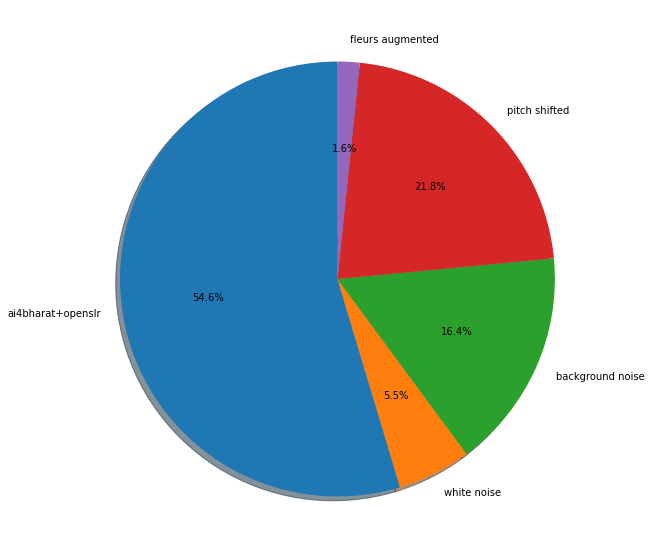

In [45]:
# plotting the durations of the datasets as a pie chart with white background

import matplotlib.pyplot as plt

# white background
plt.figure(facecolor='white')

labels = ['ai4bharat+openslr', 'white noise', 'background noise', 'pitch shifted', 'fleurs augmented']

plt.pie(durations, labels=labels, autopct='%1.1f%%', shadow=True, startangle=90)

plt.show()

In [1]:
!ls

'=3.3.2'    configs	     lightning_logs.zip   startup_script.sh	 temp
 NeMo	    documents	     notebooks		  te_manifest.json
 asr_venv   lightning_logs   resources		  te_manifest_val.json


In [90]:
import pandas as pd
transcripts_path = "resources/IndicTTS_telugu/mono/"

with open(transcripts_path+"txt.done.data") as f:
    lines = f.readlines()
    

lines

['( train_telugufemale_00001 " నరకవాసి. " )\n',
 '( train_telugufemale_00002 " బ్రహ్మదత్తుడు కాశీరాజ్యాన్ని పరిపాలించే కాలంలో ఆ నగరంలో ధనికుడైన ఒక గొప్పవర్తకుడుండేవాడు ఆయనకు మిత్ర విందకుడని ఒక కొడుకుండే వాడు ఈ మిత్రవిందకుడు ఎంతో పాపాత్ముడు వర్తకుడు చనిపోయాక ఆయన భార్య తన కుమారుడికి నాయనా దానాలు చెయ్యి నియమాలు పాటించు ధర్మం అనుసరించు అని ఎంతో హితబోధ చేసింది కాని వాడు తల్లి మాటలు కొంచెమైనా వినిపించుకోలేదు. " )\n',
 '( train_telugufemale_00003 " ఇంతలో కార్తీక పౌర్ణమి వచ్చింది మిత్రవిందకుడితో తల్లి నాయనా ఇవాళ పుణ్యదినం తెల్లవార్లూ విహారంలో ధర్మోపదేశం చేస్తారు నీవు అక్కడ అందరితోపాటు పూజచేసుకుని ఉపదేశం వినిరా తిరిగివచ్చాక నీకు వెయ్యి రుపాయలిస్తాను అన్నది. " )\n',
 '( train_telugufemale_00004 " డబ్బుకోసమని మిత్రవిందకుడు సరేనన్నాడు అతను ఉపదేశం వినటానికి వెళ్ళాడుగాని ఒక మూల పడుకుని నిద్రపోయాడు తెల్లవారుతూనే లేచి ముఖం కడుక్కుని ఇంటికి తిరిగి వచ్చాడు తన కొడుకు ధర్మబోధకుణ్ణి వెంటబెట్టుకుని, వస్తాడనే ఉద్దేశంతో అతని తల్లి వంటచేసి సిద్దంగా ఉంది కొడుకు ఒంటరిగా రావటం చూసి ధర్మభోధకుణ్ణి తీసుకురాలేదా నాయన

In [91]:
x = lines[4].split(' " ')
x[0][2:], x[1]

('train_telugufemale_00005',
 'ఆయనను ఇక్కడికి తీసుకురావటం దేనికమ్మా నా కాయనతో పనిలేదు అన్నాడు మిత్రవిందకుడు.')

In [92]:
file_names = []
transcriptions = []

for line in lines:
    x = line.split(' " ')
    file_names.append(x[0][2:])
    transcriptions.append(x[1])

len(file_names), len(transcriptions)

(4043, 4043)

In [93]:
indic_tts_df = pd.DataFrame({'audio_filepath': file_names, 'text': transcriptions})
indic_tts_df.head()

,audio_filepath,text
0,train_telugufemale_00001,నరకవాసి.
1,train_telugufemale_00002,బ్రహ్మదత్తుడు కాశీరాజ్యాన్ని పరిపాలించే కాలంలో...
2,train_telugufemale_00003,ఇంతలో కార్తీక పౌర్ణమి వచ్చింది మిత్రవిందకుడితో...
3,train_telugufemale_00004,డబ్బుకోసమని మిత్రవిందకుడు సరేనన్నాడు అతను ఉపదే...
4,train_telugufemale_00005,ఆయనను ఇక్కడికి తీసుకురావటం దేనికమ్మా నా కాయనతో...


In [94]:
# add "resources/IndicTTS_telugu/mono" to path

indic_tts_df['audio_filepath'] = "resources/IndicTTS_telugu/mono/wav_16kHz/" + indic_tts_df['audio_filepath'] + ".wav"

In [95]:
import IPython.display as ipd
import librosa

sample = librosa.load(indic_tts_df['audio_filepath'][0])
ipd.Audio(sample[0], rate=sample[1])

In [96]:
indic_tts_df

,audio_filepath,text
0,resources/IndicTTS_telugu/mono/wav_16kHz/train...,నరకవాసి.
1,resources/IndicTTS_telugu/mono/wav_16kHz/train...,బ్రహ్మదత్తుడు కాశీరాజ్యాన్ని పరిపాలించే కాలంలో...
2,resources/IndicTTS_telugu/mono/wav_16kHz/train...,ఇంతలో కార్తీక పౌర్ణమి వచ్చింది మిత్రవిందకుడితో...
3,resources/IndicTTS_telugu/mono/wav_16kHz/train...,డబ్బుకోసమని మిత్రవిందకుడు సరేనన్నాడు అతను ఉపదే...
4,resources/IndicTTS_telugu/mono/wav_16kHz/train...,ఆయనను ఇక్కడికి తీసుకురావటం దేనికమ్మా నా కాయనతో...
...,...,...
4038,resources/IndicTTS_telugu/mono/wav_16kHz/train...,ఉదయనుడు గురిచూచి కత్తివిసిరాడు కాని సర్పం ఈ సా...
4039,resources/IndicTTS_telugu/mono/wav_16kHz/train...,విషం ఎక్కిపోతున్నది ఉదయనుడికి ముచ్చెమటలు పోసిన...
4040,resources/IndicTTS_telugu/mono/wav_16kHz/train...,"అలా ఎంత సేపు, పడిఉన్నాడో తెలియదు తిరిగి స్పృహ ..."
4041,resources/IndicTTS_telugu/mono/wav_16kHz/train...,కొంతదూరం వెళ్లేసరికి ఒక పెద్ద గుహ కనిపించింది ...


In [97]:
indic_tts_df["duration"] = indic_tts_df['audio_filepath'].apply(lambda x: librosa.get_duration(filename=x))

/tmp/ipykernel_2444/606473773.py:1: FutureWarning: get_duration() keyword argument 'filename' has been renamed to 'path' in version 0.10.0.
	This alias will be removed in version 1.0.
  indic_tts_df["duration"] = indic_tts_df['audio_filepath'].apply(lambda x: librosa.get_duration(filename=x))


In [98]:
indic_tts_df.to_csv('resources/IndicTTS_telugu/indic_tts_manifest.csv', index=False)

In [44]:
indic_tts_df_pitch_shifted = indic_tts_df.copy()

In [46]:
!mkdir resources/te_indic_tts_pitch_shifted

## Pitch shifted indic_tts

In [53]:
# for i in range(len(pitch_shift_manifest_df)):
#     new_path = pitch_shift_manifest_df['audio_filepath'][i].split('/')[-1]
#     new_path = 'resources/te_fleurs/pitch_shifted/' + new_path
#     shift_pitch(pitch_shift_manifest_df['audio_filepath'][i], new_path)

new_paths = []
for i in range(len(indic_tts_df)):
    new_path = indic_tts_df['audio_filepath'][i].split('/')[-1]
    new_path = 'resources/te_indic_tts_pitch_shifted/' + new_path
    new_paths.append(new_path)
    shift_pitch(indic_tts_df['audio_filepath'][i], new_path)
indic_tts_df_pitch_shifted['new_audio_filepath'] = new_paths

In [60]:
import IPython.display as ipd
import librosa

sample = librosa.load(indic_tts_df_pitch_shifted.iloc[16]["new_audio_filepath"])
ipd.Audio(sample[0], rate=sample[1])

In [71]:
for i in range(7):
    new_path = indic_tts_df['audio_filepath'][i].split('/')[-1]
    new_path = 'resources/te_indic_tts_pitch_shifted/' + new_path
    # new_paths.append(new_path)
    shift_pitch(indic_tts_df['audio_filepath'][i], new_path)
# indic_tts_df_pitch_shifted['new_audio_filepath'] = new_paths

In [80]:
# export csv

indic_tts_df_pitch_shifted.to_csv('resources/te_indic_tts_pitch_shifted/te_indic_tts_pitch_shifted_manifest.csv', index=False)

## Background noise indic tts

In [65]:
# first 50 percent of the data

background_noise_indic_tts = indic_tts_df.iloc[:int(len(indic_tts_df)*0.5)]


In [74]:
!rm -rf resources/te_indic_tts_background_noise

In [75]:
!mkdir resources/te_indic_tts_background_noise

In [77]:
new_paths

['resources/te_indic_tts_background_noise/train_telugufemale_00001.wav',
 'resources/te_indic_tts_background_noise/train_telugufemale_00002.wav',
 'resources/te_indic_tts_background_noise/train_telugufemale_00003.wav',
 'resources/te_indic_tts_background_noise/train_telugufemale_00004.wav',
 'resources/te_indic_tts_background_noise/train_telugufemale_00005.wav',
 'resources/te_indic_tts_background_noise/train_telugufemale_00006.wav',
 'resources/te_indic_tts_background_noise/train_telugufemale_00007.wav',
 'resources/te_indic_tts_background_noise/train_telugufemale_00008.wav',
 'resources/te_indic_tts_background_noise/train_telugufemale_00009.wav',
 'resources/te_indic_tts_background_noise/train_telugufemale_00010.wav',
 'resources/te_indic_tts_background_noise/train_telugufemale_00011.wav',
 'resources/te_indic_tts_background_noise/train_telugufemale_00012.wav',
 'resources/te_indic_tts_background_noise/train_telugufemale_00013.wav',
 'resources/te_indic_tts_background_noise/train_tel

In [78]:
new_paths = []
for i in range(len(background_noise_indic_tts)):
    new_path = background_noise_indic_tts['audio_filepath'][i].split('/')[-1]
    new_path = 'resources/te_indic_tts_background_noise/' + new_path
    new_paths.append(new_path)
    add_background_noise(background_noise_indic_tts['audio_filepath'][i], new_path)
background_noise_indic_tts['new_audio_filepath'] = new_paths

/home/ubuntu/.local/lib/python3.10/site-packages/audiomentations/augmentations/add_background_noise.py:205: UserWarning: The file /home/ubuntu/users/bharath/resources/background_noises/ESC-50-master/audio/1-58277-A-3.wav is too silent to be added as noise. Returning the input unchanged.
  warnings.warn(
/home/ubuntu/.local/lib/python3.10/site-packages/audiomentations/augmentations/add_background_noise.py:205: UserWarning: The file /home/ubuntu/users/bharath/resources/background_noises/ESC-50-master/audio/3-216280-A-39.wav is too silent to be added as noise. Returning the input unchanged.
  warnings.warn(
/home/ubuntu/.local/lib/python3.10/site-packages/audiomentations/augmentations/add_background_noise.py:205: UserWarning: The file /home/ubuntu/users/bharath/resources/background_noises/ESC-50-master/audio/5-233605-A-39.wav is too silent to be added as noise. Returning the input unchanged.
  warnings.warn(
/home/ubuntu/.local/lib/python3.10/site-packages/audiomentations/augmentations/ad

In [79]:
background_noise_indic_tts.head()

,audio_filepath,text,duration,new_audio_filepath
0,resources/IndicTTS_telugu/mono/wav_16kHz/train...,నరకవాసి.,2.162000,resources/te_indic_tts_background_noise/train_...
1,resources/IndicTTS_telugu/mono/wav_16kHz/train...,బ్రహ్మదత్తుడు కాశీరాజ్యాన్ని పరిపాలించే కాలంలో...,37.200938,resources/te_indic_tts_background_noise/train_...
2,resources/IndicTTS_telugu/mono/wav_16kHz/train...,ఇంతలో కార్తీక పౌర్ణమి వచ్చింది మిత్రవిందకుడితో...,24.998875,resources/te_indic_tts_background_noise/train_...
3,resources/IndicTTS_telugu/mono/wav_16kHz/train...,డబ్బుకోసమని మిత్రవిందకుడు సరేనన్నాడు అతను ఉపదే...,34.751250,resources/te_indic_tts_background_noise/train_...
4,resources/IndicTTS_telugu/mono/wav_16kHz/train...,ఆయనను ఇక్కడికి తీసుకురావటం దేనికమ్మా నా కాయనతో...,8.268875,resources/te_indic_tts_background_noise/train_...


In [81]:
background_noise_indic_tts.to_csv('resources/te_indic_tts_background_noise/te_indic_tts_background_noise_manifest.csv', index=False)

In [111]:
import pandas as pd
transcripts_path = "resources/telugu_male_mono/mono/"

with open(transcripts_path+"txt.done.data") as f:
    lines = f.readlines()
    

lines

['( train_telugumale_00001 " ఈ గ్రామంలో ప్రజల ప్రధాన వృత్తి వ్యవసాయం. " )\n',
 '( train_telugumale_00002 " కుత్బుల్లాపూర్ ఆంధ్ర ప్రదేశ్ రాష్ట్రంలోని రంగారెడ్డి జిల్లాకు చెందిన ఒక మండలము.. " )\n',
 '( train_telugumale_00003 " జ్ఞానపీఠ పురస్కారం గ్రహీత విశ్వనాథ సత్యనారాయణ. " )\n',
 '( train_telugumale_00004 " ఈ గ్రామము కోస్గి నుంచి మద్దూరు వెళ్ళు మార్గములో కలదు. " )\n',
 '( train_telugumale_00005 " ఇక్కడ కేవలం ఐదవ తరగతి వరకు మాత్రమే పాఠశాల సౌకర్యం ఉంది. " )\n',
 '( train_telugumale_00006 " వికీపీడియా సభ్యులు రవిచంద్ర మరియు కాసుబాబు మరియు వికీపీడియా యొక్క అజ్ఞాత సభ్యులు యొక్క కృతిపై ఆధారితం. " )\n',
 '( train_telugumale_00007 " రైలు రవాణా వ్యవస్థ పరిమాణం క్రమంలో దేశాల జాబితా ఇక్కడ ఇవ్వబడింది. " )\n',
 '( train_telugumale_00008 " హిందూ సంఘం ఒక కులాల కూటమి. " )\n',
 '( train_telugumale_00009 " దయచేసి ఏదో ఒక పేజీకి లింకు పెట్టండి. " )\n',
 '( train_telugumale_00010 " జిల్లాలో ముఖ్యమైన గ్రామాలలో ఇది ఒకటి. " )\n',
 '( train_telugumale_00011 " దీని ద్వారా చుట్టు ప్రక్కల పది గ్రామాలకు నీటి సరఫరా

In [112]:
file_names = []
transcriptions = []

for line in lines:
    x = line.split(' " ')
    file_names.append(x[0][2:])
    transcriptions.append(x[1])

len(file_names), len(transcriptions)

(4533, 4533)

In [113]:
indic_tts_male_df = pd.DataFrame({'audio_filepath': file_names, 'text': transcriptions})
indic_tts_male_df.head()

,audio_filepath,text
0,train_telugumale_00001,ఈ గ్రామంలో ప్రజల ప్రధాన వృత్తి వ్యవసాయం.
1,train_telugumale_00002,కుత్బుల్లాపూర్ ఆంధ్ర ప్రదేశ్ రాష్ట్రంలోని రంగా...
2,train_telugumale_00003,జ్ఞానపీఠ పురస్కారం గ్రహీత విశ్వనాథ సత్యనారాయణ.
3,train_telugumale_00004,ఈ గ్రామము కోస్గి నుంచి మద్దూరు వెళ్ళు మార్గముల...
4,train_telugumale_00005,ఇక్కడ కేవలం ఐదవ తరగతి వరకు మాత్రమే పాఠశాల సౌకర...


In [114]:
indic_tts_male_df['audio_filepath'] = "resources/telugu_male_mono/mono/wav/" + indic_tts_male_df['audio_filepath'] + ".wav"

In [115]:
import IPython.display as ipd
import librosa

sample = librosa.load(indic_tts_male_df['audio_filepath'][0])
ipd.Audio(sample[0], rate=sample[1])

In [116]:
indic_tts_male_df["duration"] = indic_tts_male_df['audio_filepath'].apply(lambda x: librosa.get_duration(filename=x))

/tmp/ipykernel_2444/1646135631.py:1: FutureWarning: get_duration() keyword argument 'filename' has been renamed to 'path' in version 0.10.0.
	This alias will be removed in version 1.0.
  indic_tts_male_df["duration"] = indic_tts_male_df['audio_filepath'].apply(lambda x: librosa.get_duration(filename=x))


In [117]:
# sum of durations of all the audio files

duration = sum(indic_tts_male_df["duration"])/60/60
duration

12.791306359953694

In [118]:
indic_tts_male_df.to_csv('resources/telugu_male_mono/indic_tts_male_manifest.csv', index=False)

## Pitch Shift

In [100]:
indic_tts_male_df_pitch_shifted = indic_tts_male_df.copy()

In [101]:
!mkdir resources/te_indic_male_tts_pitch_shifted/

In [102]:
new_paths = []
for i in range(len(indic_tts_male_df)):
    new_path = indic_tts_male_df['audio_filepath'][i].split('/')[-1]
    new_path = 'resources/te_indic_male_tts_pitch_shifted/' + new_path
    new_paths.append(new_path)
    shift_pitch(indic_tts_male_df['audio_filepath'][i], new_path)
indic_tts_male_df_pitch_shifted['new_audio_filepath'] = new_paths

In [105]:
indic_tts_male_df_pitch_shifted.head()

,audio_filepath,text,duration,new_audio_filepath
0,resources/telugu_male_mono/mono/wav/train_telu...,ఈ గ్రామంలో ప్రజల ప్రధాన వృత్తి వ్యవసాయం.,4.205333,resources/te_indic_male_tts_pitch_shifted/trai...
1,resources/telugu_male_mono/mono/wav/train_telu...,కుత్బుల్లాపూర్ ఆంధ్ర ప్రదేశ్ రాష్ట్రంలోని రంగా...,6.432000,resources/te_indic_male_tts_pitch_shifted/trai...
2,resources/telugu_male_mono/mono/wav/train_telu...,జ్ఞానపీఠ పురస్కారం గ్రహీత విశ్వనాథ సత్యనారాయణ.,4.805333,resources/te_indic_male_tts_pitch_shifted/trai...
3,resources/telugu_male_mono/mono/wav/train_telu...,ఈ గ్రామము కోస్గి నుంచి మద్దూరు వెళ్ళు మార్గముల...,4.917333,resources/te_indic_male_tts_pitch_shifted/trai...
4,resources/telugu_male_mono/mono/wav/train_telu...,ఇక్కడ కేవలం ఐదవ తరగతి వరకు మాత్రమే పాఠశాల సౌకర...,5.218667,resources/te_indic_male_tts_pitch_shifted/trai...


In [106]:
indic_tts_male_df_pitch_shifted.to_csv('resources/te_indic_male_tts_pitch_shifted/indic_tts_male_pitch_shifted_manifest.csv', index=False)

## Background noise

In [120]:
!rm -rf resources/te_indic_male_tts_background_noise/

In [121]:
indic_tts_male_background_noise = indic_tts_male_df.iloc[:int(len(indic_tts_male_df)*0.5)]

!mkdir resources/te_indic_male_tts_background_noise/

new_paths = []
for i in range(len(indic_tts_male_background_noise)):
    new_path = indic_tts_male_background_noise['audio_filepath'][i].split('/')[-1]
    new_path = 'resources/te_indic_male_tts_background_noise/' + new_path
    new_paths.append(new_path)
    add_background_noise(indic_tts_male_background_noise['audio_filepath'][i], new_path)
indic_tts_male_background_noise['new_audio_filepath'] = new_paths

/home/ubuntu/.local/lib/python3.10/site-packages/audiomentations/augmentations/add_background_noise.py:205: UserWarning: The file /home/ubuntu/users/bharath/resources/background_noises/ESC-50-master/audio/1-36393-A-23.wav is too silent to be added as noise. Returning the input unchanged.
  warnings.warn(
/home/ubuntu/.local/lib/python3.10/site-packages/audiomentations/augmentations/add_background_noise.py:205: UserWarning: The file /home/ubuntu/users/bharath/resources/background_noises/ESC-50-master/audio/2-70344-A-33.wav is too silent to be added as noise. Returning the input unchanged.
  warnings.warn(
/home/ubuntu/.local/lib/python3.10/site-packages/audiomentations/augmentations/add_background_noise.py:205: UserWarning: The file /home/ubuntu/users/bharath/resources/background_noises/ESC-50-master/audio/1-36397-A-23.wav is too silent to be added as noise. Returning the input unchanged.
  warnings.warn(
/home/ubuntu/.local/lib/python3.10/site-packages/audiomentations/augmentations/add

In [122]:
indic_tts_male_background_noise.to_csv("resources/te_indic_male_tts_background_noise/indic_tts_male_background_noise_manifest.csv", index=False)